NOTEBOOK PENTRU CAPITOLUL REZULTATE OBTINUTE 

In [ ]:
#MODEL
import os
import sys
os.environ["KERAS_BACKEND"] = "tensorflow"
os.environ['XLA_FLAGS'] = '--xla_gpu_strict_conv_algorithm_picker=false'
os.environ["CUDA_VISIBLE_DEVICES"] = "2"

import numpy as np
import tensorflow as tf
from tensorflow import keras
from keras import ops
from keras import layers


from PIL import Image
import matplotlib.pyplot as plt

from keras import utils, models
from keras.layers import Rescaling
from keras.applications.vgg19 import VGG19
from keras.applications.vgg19 import preprocess_input


print('keras: ', keras.__version__)
print('tensorflow: ',tf.__version__)
print('python: ',sys.version)
print(tf.version.GIT_VERSION, tf.version.VERSION)

print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

#####CONFIGS#####
Train = True
epochs = 100
latent_dim = 512
BATCH_SIZE_PER_REPLICA = 64
###################



class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a face."""

    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.seed_generator = keras.random.SeedGenerator(280602)

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = ops.shape(z_mean)[0]
        dim = ops.shape(z_mean)[1]
        epsilon = keras.random.normal(shape=(batch, dim), seed=self.seed_generator)
        return z_mean + ops.exp(0.5 * z_log_var) * epsilon
    
def create_encoder(input_shape=(128, 128, 3), latent_dim=512):
    inputs = keras.Input(shape=input_shape)
    
    
    x = layers.Conv2D(64, (4,4), activation='leaky_relu', strides=2, padding='same')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.2)(x)
    
    x = layers.Conv2D(128, (4,4), activation='leaky_relu', strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.2)(x)
    
    x = layers.Conv2D(256, (4,4), activation='leaky_relu', strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.2)(x)
    
    x = layers.Conv2D(512, (4,4), activation='leaky_relu', strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.2)(x)
    
    x = layers.Flatten()(x)
    
    # Add dense layers before final latent space
    x = layers.Dense(512, activation='leaky_relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.2)(x)
    
    z_mean = layers.Dense(latent_dim, name='z_mean')(x)
    z_log_var = layers.Dense(latent_dim, name='z_log_var')(x)
    z = Sampling()([z_mean, z_log_var])
    
    return keras.Model(inputs, [z_mean, z_log_var, z], name='improved_encoder')


def create_decoder(latent_dim=512):
    latent_inputs = keras.Input(shape=(latent_dim,))
    
    x = layers.Dense(8*8*512, activation='leaky_relu')(latent_inputs)
    x = layers.Reshape((8, 8, 512))(x)
    
    x = layers.Conv2DTranspose(256, (4,4), activation='leaky_relu', strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    
    x = layers.Conv2DTranspose(128, (4,4), activation='leaky_relu', strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    
    x = layers.Conv2DTranspose(64, (4,4), activation='leaky_relu', strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    
    x = layers.Conv2DTranspose(32, (4,4), activation='leaky_relu', strides=2, padding='same')(x)
    x = layers.BatchNormalization()(x)
    
    decoder_outputs = layers.Conv2DTranspose(3, (4,4), activation='sigmoid', padding='same')(x)
    
    return keras.Model(latent_inputs, decoder_outputs, name='improved_decoder')


class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super().__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.lambda_reconstruction = 0.1
        self.lambda_perceptual = 0.1
        
        # Initialize VGG19 for feature extraction (use pre-trained weights)
        vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
        
        # Choose intermediate layers for feature comparison
        self.feature_layers = [
            'block1_conv2',  # Low-level features
            'block2_conv2',  # Mid-level features
            'block3_conv2',  # Higher-level features
            'block4_conv2'   # Very high-level features
        ]
        
        # Create a model that outputs features from these layers
        self.feature_extractor = keras.Model(
            inputs=vgg.input, 
            outputs=[vgg.get_layer(name).output for name in self.feature_layers]
        )
        
        # Freeze the VGG19 weights
        self.feature_extractor.trainable = False
        
        # Tracking metrics
        self.total_loss_tracker = keras.metrics.Mean(name='total_loss')
        self.reconstruction_loss_tracker = keras.metrics.Mean(name='reconstruction_loss')
        self.perceptual_loss_tracker = keras.metrics.Mean(name='perceptual_loss')
        self.kl_loss_tracker = keras.metrics.Mean(name='kl_loss')
        
        # Add validation metrics
        self.val_total_loss_tracker = keras.metrics.Mean(name='val_total_loss')
        self.val_reconstruction_loss_tracker = keras.metrics.Mean(name='val_reconstruction_loss')
        self.val_perceptual_loss_tracker = keras.metrics.Mean(name='val_perceptual_loss')
        self.val_kl_loss_tracker = keras.metrics.Mean(name='val_kl_loss')
    
    def call(self, inputs):
        # Implement the forward pass
        z_mean, z_log_var, z = self.encoder(inputs)
        reconstruction = self.decoder(z)
        return reconstruction
    
    
    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.perceptual_loss_tracker,
            self.kl_loss_tracker,
            self.val_total_loss_tracker,
            self.val_reconstruction_loss_tracker,
            self.val_perceptual_loss_tracker,
            self.val_kl_loss_tracker
        ]
    
    def compute_perceptual_loss(self, original, reconstructed):
        # Preprocess images for VGG19 (ensure 3 channels and correct scaling)
        original_processed = preprocess_input(original * 255.0)
        reconstructed_processed = preprocess_input(reconstructed * 255.0)
        
        # Extract features for original and reconstructed images
        original_features = self.feature_extractor(original_processed)
        reconstructed_features = self.feature_extractor(reconstructed_processed)
    
        
        # Compute perceptual loss as mean squared error between features
        perceptual_loss = 0
        for orig_feat, recon_feat in zip(original_features, reconstructed_features):
            perceptual_loss += ops.mean(ops.square(orig_feat - recon_feat))

        
        # Normalize by the number of feature layers
        perceptual_loss /= len(self.feature_layers)
        
        return perceptual_loss
    
    def compute_reconstruction_loss(self, original, reconstructed):
        
        reconstruction_loss = ops.mean(
                ops.sum(
                    keras.losses.binary_crossentropy(original, reconstructed),
                    axis=(1,2)
                )
            )
        
        return reconstruction_loss
   
    
    def train_step(self, data):
        with tf.GradientTape() as tape:
            # Encoder forward pass
            z_mean, z_log_var, z = self.encoder(data)
            
            # Decoder reconstruction
            reconstruction = self.decoder(z)
            
            # Compute KL divergence loss
            kl_loss = -0.5 * (1 + z_log_var - ops.square(z_mean) - ops.exp(z_log_var))
            kl_loss = ops.mean(ops.sum(kl_loss, axis=1))
            
            
            # Compute perceptual loss using VGG19 features
            perceptual_loss = self.compute_perceptual_loss(data, reconstruction) * self.lambda_perceptual
            
            reconstruction_loss = self.compute_reconstruction_loss(data, reconstruction) * self.lambda_reconstruction
            
            # Total loss combines reconstruction losses and KL divergence
            total_loss = kl_loss + (perceptual_loss + reconstruction_loss)/2
        
        # Compute gradients and apply them
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        
        # Update metrics
        self.total_loss_tracker.update_state(total_loss)
        self.perceptual_loss_tracker.update_state(perceptual_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        
        return {
            "loss": self.total_loss_tracker.result(),
            "perceptual_loss": self.perceptual_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result()
        }
    
    def test_step(self, data):
        # Encoder forward pass
        z_mean, z_log_var, z = self.encoder(data)
        
        # Decoder reconstruction
        reconstruction = self.decoder(z)
        
        # Compute KL divergence loss
        kl_loss = -0.5 * (1 + z_log_var - ops.square(z_mean) - ops.exp(z_log_var))
        kl_loss = ops.mean(ops.sum(kl_loss, axis=1))
        
        # Compute perceptual loss using VGG19 features
        perceptual_loss = self.compute_perceptual_loss(data, reconstruction) * self.lambda_perceptual
        
        reconstruction_loss = self.compute_reconstruction_loss(data, reconstruction) * self.lambda_reconstruction
        
        # Total loss combines perceptual loss and KL divergence
        total_loss = kl_loss + (reconstruction_loss + perceptual_loss)/2
        
        # Update validation metrics
        self.val_total_loss_tracker.update_state(total_loss)
        self.val_perceptual_loss_tracker.update_state(perceptual_loss)
        self.val_kl_loss_tracker.update_state(kl_loss)
        self.val_reconstruction_loss_tracker.update_state(reconstruction_loss)
        
        return {
            "loss": self.val_total_loss_tracker.result(),
            "perceptual_loss": self.val_perceptual_loss_tracker.result(),
            "kl_loss": self.val_kl_loss_tracker.result(),
            "reconstruction_loss": self.val_reconstruction_loss_tracker.result()
        }

encoder = create_encoder(latent_dim=512)
decoder = create_decoder(latent_dim=512)
vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-4))
vae.load_weights('results_encode_decode/20/vae_weights.weights.h5')
vae.summary()

In [2]:
###TRAINING DATA###        
full_dataset = utils.image_dataset_from_directory(
    './Dataset/all_images',
    seed=123,
    shuffle=True,
    image_size=(128, 128),
    batch_size=None,
    label_mode=None
)

normalization_layer = Rescaling(1./255)
full_dataset = full_dataset.map(lambda x: normalization_layer(x))

# Compute counts
total_images = 200_000
train_count = 180_000
val_count = 10_000
test_count = 10_000 #approximately

# Split manually
train_data = full_dataset.take(train_count)
val_test_split = full_dataset.skip(train_count)
val_data = val_test_split.take(val_count)
test_data = val_test_split.skip(val_count)


Found 202599 files.


In [ ]:
# Get 5 random images from the test data
test_batch = test_data.batch(5).take(1)
sample_images = next(iter(test_batch))

# Create a figure to display the images
plt.figure(figsize=(15, 3))

# Display each image
for i in range(5):
    plt.subplot(1, 5, i + 1)
    plt.imshow(sample_images[i])
    plt.axis('off')

plt.tight_layout()

# Save the figure
plt.savefig('results_encode_decode/20/attribute_analysis/analysis/sample_images.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# Generate reconstructions for the sample images
z_mean, z_log_var, z = encoder(sample_images)
reconstructions = decoder(z)

# Display original and reconstructed images side by side
plt.figure(figsize=(20, 8))

for i in range(5):
    # Original image
    plt.subplot(2, 5, i + 1)
    plt.imshow(sample_images[i])
    plt.title('Original')
    plt.axis('off')
    
    # Reconstructed image
    plt.subplot(2, 5, i + 6)
    plt.imshow(reconstructions[i])
    plt.title('Reconstructed')
    plt.axis('off')

plt.tight_layout()

# Save the comparison figure
plt.savefig('results_encode_decode/20/attribute_analysis/analysis/reconstruction_comparison.png', dpi=300, bbox_inches='tight')
plt.show()


In [ ]:
# Compute MSE between original and reconstructed images across all test data
def compute_mse_on_test_data(test_data, encoder, decoder, batch_size=64):
    # Initialize variable to store total MSE
    total_mse = 0.0
    num_batches = 0
    
    # Process test data in batches
    test_batches = test_data.batch(batch_size)
    
    for batch in test_batches:
        # Generate reconstructions
        z_mean, z_log_var, z = encoder(batch)
        reconstructions = decoder(z)
        
        # Calculate MSE for this batch
        batch_mse = tf.reduce_mean(tf.square(batch - reconstructions))
        
        # Accumulate MSE and count batches
        total_mse += batch_mse.numpy()
        num_batches += 1
    
    # Calculate average MSE across all batches
    avg_mse = total_mse / num_batches
    
    return avg_mse

# Compute the MSE on test data
mse = compute_mse_on_test_data(test_data, encoder, decoder)
print(f"Average MSE on test data: {mse:.6f}")

# Calculate additional metrics like PSNR (Peak Signal-to-Noise Ratio)
psnr = -10 * np.log10(mse)
print(f"Average PSNR on test data: {psnr:.2f} dB")

# Create a visualization of the distribution of MSE values on individual images
plt.figure(figsize=(10, 6))

# Calculate MSE for all individual test images for visualization
individual_mses = []
# Use all test data by batching with size 1
all_test_data = test_data.batch(1)

for img in all_test_data:
    z_mean, z_log_var, z = encoder(img)
    reconstruction = decoder(z)
    img_mse = tf.reduce_mean(tf.square(img - reconstruction)).numpy()
    individual_mses.append(img_mse)

plt.hist(individual_mses, bins=50, alpha=0.7)
plt.axvline(mse, color='r', linestyle='dashed', linewidth=2, label=f'Average MSE: {mse:.6f}')
plt.xlabel('MSE Value')
plt.ylabel('Frequency')
plt.title('Distribution of MSE Values on All Test Images')
plt.legend()
plt.savefig('results_encode_decode/20/attribute_analysis/analysis/mse_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Încarcă vectorul de atribut pentru zâmbet (smiling)
smiling_vector = np.load('results_encode_decode/20/attribute_analysis/attribute_vectors/Smiling_vector.npy')

# Selectează o imagine de test
#test_batch = test_data.batch(1).take(1)
#sample_img = next(iter(test_batch))

# Obține vectorul latent pentru imagine
z_mean, z_log_var, z = encoder(sample_img)

# Generează intensități de la -4 la 4 cu increment de 1
intensities = np.arange(-4, 5, 1)

# Creează vectorii latenti modificați
latent_vectors = []
for intensity in intensities:
    latent_vectors.append(z.numpy() + intensity * smiling_vector)
latent_vectors = np.concatenate(latent_vectors, axis=0)

# Decodează imaginile modificate
generated_images = decoder(latent_vectors).numpy()

# Afișează imaginile pe o singură linie
plt.figure(figsize=(20, 4))
for idx, img in enumerate(generated_images):
    plt.subplot(1, len(generated_images), idx + 1)
    plt.imshow(img)
    plt.title(f"{intensities[idx]}", fontsize=20)
    plt.axis('off')
plt.tight_layout()
plt.savefig('results_encode_decode/20/attribute_analysis/analysis/smiling_intensity_line.png', dpi=300, bbox_inches='tight')
plt.show()


In [ ]:
# Folosește vectorul de atribut pentru zâmbet (smiling)
smiling_vector = np.load('results_encode_decode/20/attribute_analysis/attribute_vectors/Smiling_vector.npy')

# Creează vectorii latenti pentru valorile extreme și original
latent_vectors = np.concatenate([
    z.numpy() + (-10) * smiling_vector,
    z.numpy(),
    z.numpy() + (10) * smiling_vector
], axis=0)

# Decodează imaginile modificate
generated_images = decoder(latent_vectors).numpy()

# Afișează imaginile: -10, original, +10
plt.figure(figsize=(12, 4))
titles = ['-10', 'Original', '+10']
for idx, img in enumerate(generated_images):
    plt.subplot(1, 3, idx + 1)
    plt.imshow(img)
    plt.title(titles[idx], fontsize=18)
    plt.axis('off')
plt.tight_layout()
plt.savefig('results_encode_decode/20/attribute_analysis/analysis/smiling_extremes.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
# Start with the same latent vector z (from the selected image above)
current_img = sample_img.numpy()  # sample_img is the image used above

reconstructed_imgs = [current_img[0]]  # Store the original image

# Reconstruct the image 5 times in a loop
for i in range(8):
    # Encode and decode the image
    z_mean, z_log_var, z = encoder(tf.expand_dims(current_img[0], axis=0))
    reconstruction = decoder(z).numpy()
    reconstructed_imgs.append(reconstruction[0])
    # Use the reconstruction as the next input
    current_img = reconstruction

# Plot the original and all reconstructions in a row
plt.figure(figsize=(20, 4))
for idx, img in enumerate(reconstructed_imgs):
    plt.subplot(1, 9, idx + 1)
    plt.imshow(img)
    if idx == 0:
        plt.title("Original", fontsize=16)
    else:
        plt.title(f"Recon {idx}", fontsize=16)
    plt.axis('off')
plt.tight_layout()
plt.savefig('results_encode_decode/20/attribute_analysis/analysis/continuous_reconstruction.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
import numpy as np
from matplotlib.gridspec import GridSpec

import matplotlib.pyplot as plt

# Load the attribute vectors
bangs_vector = np.load('results_encode_decode/20/attribute_analysis/attribute_vectors/Bangs_vector.npy')
narrow_eyes_vector = np.load('results_encode_decode/20/attribute_analysis/attribute_vectors/Narrow_Eyes_vector.npy')
smiling_vector = np.load('results_encode_decode/20/attribute_analysis/attribute_vectors/Smiling_vector.npy')
blond_hair_vector = np.load('results_encode_decode/20/attribute_analysis/attribute_vectors/Blond_Hair_vector.npy')

#negate the smiling vector to make it negative
smiling_vector = -smiling_vector

# Select a random face from test data
test_batch = test_data.batch(1).take(1)
original_face = next(iter(test_batch))

# Get the latent vector for the face
z_mean, z_log_var, z = encoder(original_face)

# Create a grid of images with different attribute combinations
grid_size = 6
intensity = 5.0  # Maximum intensity

# Create empty grid to store the latent vectors
latent_grid = np.zeros((grid_size, grid_size, z.shape[1]))

# Calculate intensity factors for each position in the grid
x_factors = np.linspace(0, 1, grid_size)
y_factors = np.linspace(0, 1, grid_size)

# Fill the grid with latent vectors
for i, y_factor in enumerate(y_factors):
    for j, x_factor in enumerate(x_factors):
        # Base latent vector
        base_vector = z.numpy().copy()
        
        # Top-left: Bangs (maximum at top-left corner)
        bangs_intensity = intensity * (1 - x_factor) * (1 - y_factor)
        
        # Top-right: Narrow Eyes (maximum at top-right corner)
        narrow_eyes_intensity = intensity * x_factor * (1 - y_factor)
        
        # Bottom-left: Smiling (maximum at bottom-left corner)
        smiling_intensity = intensity * (1 - x_factor) * y_factor
        
        # Bottom-right: Blond Hair (maximum at bottom-right corner)
        blond_hair_intensity = intensity * x_factor * y_factor
        
        # Combine the vectors with their respective intensities
        latent_grid[i, j] = base_vector + \
                           bangs_intensity * bangs_vector + \
                           narrow_eyes_intensity * narrow_eyes_vector + \
                           smiling_intensity * smiling_vector + \
                           blond_hair_intensity * blond_hair_vector

# Reshape the grid to feed into the decoder
latent_vectors = latent_grid.reshape(-1, z.shape[1])

# Generate images from the latent vectors
generated_images = []
batch_size = 16  # Process in batches to avoid memory issues
for i in range(0, latent_vectors.shape[0], batch_size):
    batch = latent_vectors[i:i+batch_size]
    decoded_batch = decoder(batch).numpy()
    generated_images.extend(decoded_batch)

generated_images = np.array(generated_images)

# Reshape back to grid for visualization
generated_grid = generated_images.reshape(grid_size, grid_size, *generated_images.shape[1:])

# Create figure for visualization
plt.figure(figsize=(20, 20))
gs = GridSpec(grid_size, grid_size)



# Plot the grid of images
for i in range(grid_size):
    for j in range(grid_size):
        ax = plt.subplot(gs[i, j])
        ax.imshow(generated_grid[i, j])
        ax.axis('off')

plt.tight_layout()
plt.savefig('results_encode_decode/20/attribute_analysis/analysis/attribute_gradient_grid.png', dpi=300, bbox_inches='tight')
plt.show()



In [ ]:
encoder_2 = create_encoder(latent_dim=512)
decoder_2 = create_decoder(latent_dim=512)
vae_recon_plus = VAE(encoder_2, decoder_2)
vae_recon_plus.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-4))
vae_recon_plus.load_weights('results_encode_decode/22/vae_weights.weights.h5')

encoder_3 = create_encoder(latent_dim=512)
decoder_3 = create_decoder(latent_dim=512)
vae_kl_plus = VAE(encoder_3, decoder_3)
vae_kl_plus.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-4))
vae_kl_plus.load_weights('results_encode_decode/24/vae_weights.weights.h5')


In [ ]:
# Select 1 test image
#test_batch = test_data.batch(1).take(1)
#sample_image = next(iter(test_batch))

# Get reconstructions from each VAE
z_mean1, z_log_var1, z1 = encoder(sample_image)
recon1 = decoder(z1)

z_mean2, z_log_var2, z2 = encoder_2(sample_image)
recon2 = decoder_2(z2)

z_mean3, z_log_var3, z3 = encoder_3(sample_image)
recon3 = decoder_3(z3)

# Plot original and reconstructions
plt.figure(figsize=(12, 4))
titles = ['Original', 'VAE', 'VAE Recon+', 'VAE KL+']

plt.subplot(1, 4, 1)
plt.imshow(sample_image[0])
plt.title(titles[0])
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(recon1[0])
plt.title(titles[1])
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(recon2[0])
plt.title(titles[2])
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(recon3[0])
plt.title(titles[3])
plt.axis('off')

plt.tight_layout()
plt.savefig('results_encode_decode/20/attribute_analysis/analysis/vae_comparison_single.png', dpi=300, bbox_inches='tight')
plt.show()


In [ ]:
# Load the smile (smiling) attribute vector
smiling_vector = np.load('results_encode_decode/20/attribute_analysis/attribute_vectors/Smiling_vector.npy')


# Get latent vectors for the image from all 3 encoders
z_mean1, z_log_var1, z1 = encoder(sample_image)
z_mean2, z_log_var2, z2 = encoder_2(sample_image)
z_mean3, z_log_var3, z3 = encoder_3(sample_image)

# Add smile vector with intensity 3
z1_smile = z1.numpy() - 3 * smiling_vector
z2_smile = z2.numpy() - 3 * smiling_vector
z3_smile = z3.numpy() - 3 * smiling_vector

# Decode the modified latent vectors
recon1_smile = decoder(z1_smile).numpy()
recon2_smile = decoder_2(z2_smile).numpy()
recon3_smile = decoder_3(z3_smile).numpy()

# Plot original and smile-modified reconstructions for all 3 VAEs
plt.figure(figsize=(12, 6))
titles = ['Original', 'VAE', 'VAE Recon+', 'VAE KL+']

plt.subplot(1, 4, 1)
plt.imshow(sample_image[0])
plt.title(titles[0])
plt.axis('off')

plt.subplot(1, 4, 2)
plt.imshow(recon1_smile[0])
plt.title(titles[1])
plt.axis('off')

plt.subplot(1, 4, 3)
plt.imshow(recon2_smile[0])
plt.title(titles[2])
plt.axis('off')

plt.subplot(1, 4, 4)
plt.imshow(recon3_smile[0])
plt.title(titles[3])
plt.axis('off')

plt.tight_layout()
plt.savefig('results_encode_decode/20/attribute_analysis/analysis/vae_smile_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
class VAE_NO_VGG(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super().__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.lambda_reconstruction = 0.1
        self.lambda_kl = 1

        
        # Tracking metrics
        self.total_loss_tracker = keras.metrics.Mean(name='total_loss')
        self.reconstruction_loss_tracker = keras.metrics.Mean(name='reconstruction_loss')
        self.kl_loss_tracker = keras.metrics.Mean(name='kl_loss')
        
        # Add validation metrics
        self.val_total_loss_tracker = keras.metrics.Mean(name='val_total_loss')
        self.val_reconstruction_loss_tracker = keras.metrics.Mean(name='val_reconstruction_loss')
        self.val_kl_loss_tracker = keras.metrics.Mean(name='val_kl_loss')
    
    def call(self, inputs):
        # Implement the forward pass
        z_mean, z_log_var, z = self.encoder(inputs)
        reconstruction = self.decoder(z)
        return reconstruction
    
    
    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
            self.val_total_loss_tracker,
            self.val_reconstruction_loss_tracker,
            self.val_kl_loss_tracker
        ]
    
    
    def compute_reconstruction_loss(self, original, reconstructed):
        
        reconstruction_loss = ops.mean(
                ops.sum(
                    keras.losses.binary_crossentropy(original, reconstructed),
                    axis=(1,2)
                )
            )
        
        return reconstruction_loss
   
    
    def train_step(self, data):
        with tf.GradientTape() as tape:
            # Encoder forward pass
            z_mean, z_log_var, z = self.encoder(data)
            
            # Decoder reconstruction
            reconstruction = self.decoder(z)
            
            # Compute KL divergence loss
            kl_loss = -0.5 * (1 + z_log_var - ops.square(z_mean) - ops.exp(z_log_var))
            kl_loss = ops.mean(ops.sum(kl_loss, axis=1))
            kl_loss = kl_loss * self.lambda_kl
            
            
            reconstruction_loss = self.compute_reconstruction_loss(data, reconstruction) * self.lambda_reconstruction
            
            # Total loss combines reconstruction losses and KL divergence
            total_loss = kl_loss + reconstruction_loss
        
        # Compute gradients and apply them
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        
        # Update metrics
        self.total_loss_tracker.update_state(total_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        
        return {
            "loss": self.total_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result()
        }
    
    def test_step(self, data):
        # Encoder forward pass
        z_mean, z_log_var, z = self.encoder(data)
        
        # Decoder reconstruction
        reconstruction = self.decoder(z)
        
        # Compute KL divergence loss
        kl_loss = -0.5 * (1 + z_log_var - ops.square(z_mean) - ops.exp(z_log_var))
        kl_loss = ops.mean(ops.sum(kl_loss, axis=1))
        kl_loss = kl_loss * self.lambda_kl

        reconstruction_loss = self.compute_reconstruction_loss(data, reconstruction) * self.lambda_reconstruction
        
        # Total loss combines perceptual loss and KL divergence
        total_loss = kl_loss + reconstruction_loss 
        
        # Update validation metrics
        self.val_total_loss_tracker.update_state(total_loss)
        self.val_kl_loss_tracker.update_state(kl_loss)
        self.val_reconstruction_loss_tracker.update_state(reconstruction_loss)
        
        return {
            "loss": self.val_total_loss_tracker.result(),
            "kl_loss": self.val_kl_loss_tracker.result(),
            "reconstruction_loss": self.val_reconstruction_loss_tracker.result()
        }


encoder_2 = create_encoder(latent_dim=512)
decoder_2 = create_decoder(latent_dim=512)
vae_no_VGG = VAE_NO_VGG(encoder_2, decoder_2)
vae_no_VGG.compile(optimizer=keras.optimizers.Adam(learning_rate=1e-4))
vae_no_VGG.load_weights('results_encode_decode/26/vae_weights.weights.h5')

In [ ]:
# Select a test image
#test_batch = test_data.batch(1).take(1)
#sample_img = next(iter(test_batch))

# Get reconstructions from both models
z_mean_vae, z_log_var_vae, z_vae = encoder(sample_img)
recon_vae = decoder(z_vae)

z_mean_no_vgg, z_log_var_no_vgg, z_no_vgg = encoder_2(sample_img)
recon_no_vgg = decoder_2(z_no_vgg)

# Plot original and reconstructions
plt.figure(figsize=(10, 4))
titles = ['Original', 'VAE (with VGG)', 'VAE (no VGG)']

plt.subplot(1, 3, 1)
plt.imshow(sample_img[0])
plt.title(titles[0], fontsize=18)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(recon_vae[0])
plt.title(titles[1], fontsize=18)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(recon_no_vgg[0])
plt.title(titles[2], fontsize=18)
plt.axis('off')

plt.tight_layout()
plt.savefig('results_encode_decode/20/attribute_analysis/analysis/vgg_no_vgg_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
import os

# Load all attribute vectors from both folders
def load_attribute_vectors(folder):
    attr_vecs = {}
    for fname in os.listdir(folder):
        if fname.endswith('_vector.npy'):
            attr_name = fname.replace('_vector.npy', '')
            attr_vecs[attr_name] = np.load(os.path.join(folder, fname))
    return attr_vecs

attr_vecs_set1 = load_attribute_vectors('results_encode_decode/20/attribute_analysis/selected_attribute_vectors')
attr_vecs_set2 = load_attribute_vectors('results_encode_decode/20/attribute_analysis/selected_orthogonalised_vectors')

# Pick a random test image
test_batch = test_data.batch(1).take(1)
sample_img = next(iter(test_batch))

# Get latent vector for the image
z_mean, z_log_var, z = encoder(sample_img)

attributes = sorted(attr_vecs_set1.keys())

plt.figure(figsize=(10, 3 * len(attributes)))

for idx, attr in enumerate(attributes):
    recon_orig = decoder(z).numpy()[0]
    z_mod1 = z.numpy() + 4 * attr_vecs_set1[attr]
    recon_mod1 = decoder(z_mod1).numpy()[0]
    z_mod2 = z.numpy() + 8 * attr_vecs_set2[attr]
    recon_mod2 = decoder(z_mod2).numpy()[0]
    
    plt.subplot(len(attributes), 3, idx * 3 + 1)
    plt.imshow(recon_orig)
    plt.title(f"{attr} - Original")
    plt.axis('off')
    
    plt.subplot(len(attributes), 3, idx * 3 + 2)
    plt.imshow(recon_mod1)
    plt.title(f"{attr} +4 (Set 1)")
    plt.axis('off')
    
    plt.subplot(len(attributes), 3, idx * 3 + 3)
    plt.imshow(recon_mod2)
    plt.title(f"{attr} +4 (Set 2)")
    plt.axis('off')

plt.tight_layout()
plt.show()


2025-06-21 17:51:28.817157: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:11: Filling up shuffle buffer (this may take a while): 1 of 10000
2025-06-21 17:51:31.800127: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.
2025-06-21 17:51:31.944916: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
W0000 00:00:1750528292.085778 1205613 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1750528292.108065 1205613 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1750528292.108979 1205613 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1750528292.119901 1205613 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1750528292.120775 1205613 gpu_timer.cc:114] Skipping the delay kernel, measur

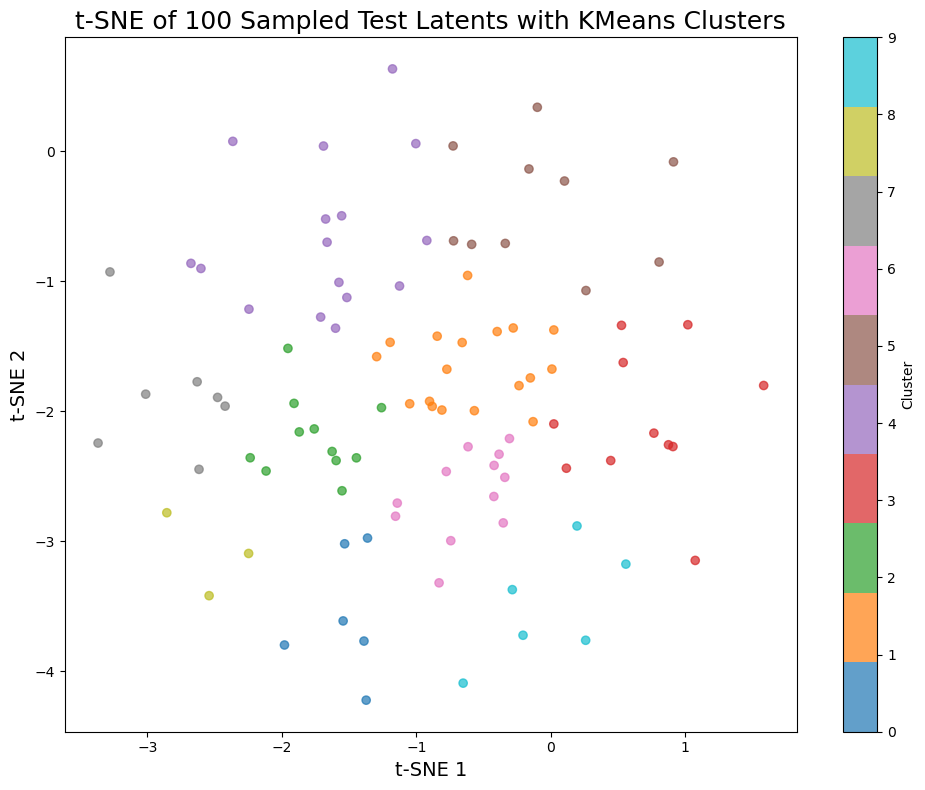

In [7]:
# Encode a random sample of 100 test images, reduce dimensionality, cluster, and plot

import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from tqdm import tqdm

# 1. Sample 100 random test images
sampled_images = []
for img in test_data.shuffle(10000, seed=42).take(100):
    sampled_images.append(img.numpy())
sampled_images = np.stack(sampled_images, axis=0)

# 2. Encode sampled images to latent space
z_mean, z_log_var, z = encoder(sampled_images)
all_latents_sample = z.numpy()

# 3. Dimensionality reduction (PCA then t-SNE)
pca = PCA(n_components=50, random_state=42)
latents_pca = pca.fit_transform(all_latents_sample)
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
latents_2d = tsne.fit_transform(latents_pca)

# 4. Clustering (KMeans, k=8)
kmeans = KMeans(n_clusters=10, random_state=42)
clusters = kmeans.fit_predict(latents_2d)

# 5. Plot the clusters
plt.figure(figsize=(10, 8))
scatter = plt.scatter(latents_2d[:, 0], latents_2d[:, 1], c=clusters, cmap='tab10', alpha=0.7)
plt.title("t-SNE of 100 Sampled Test Latents with KMeans Clusters", fontsize=18)
plt.xlabel("t-SNE 1", fontsize=14)
plt.ylabel("t-SNE 2", fontsize=14)
plt.colorbar(scatter, label='Cluster')
plt.tight_layout()
plt.savefig('results_encode_decode/20/attribute_analysis/analysis/latent_clusters_tsne_sample100.png', dpi=300)

2025-06-21 18:43:54.675503: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:14: Filling up shuffle buffer (this may take a while): 1 of 10000
2025-06-21 18:43:56.445826: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.
W0000 00:00:1750531441.758417 1205613 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1750531441.781974 1205613 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1750531441.788906 1205613 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1750531441.794737 1205613 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1750531441.824504 1205613 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0000 00:00:1750531441.855479 1205613 gpu_timer.cc:114] Skipping the delay kernel, measurement accuracy will be reduced
W0

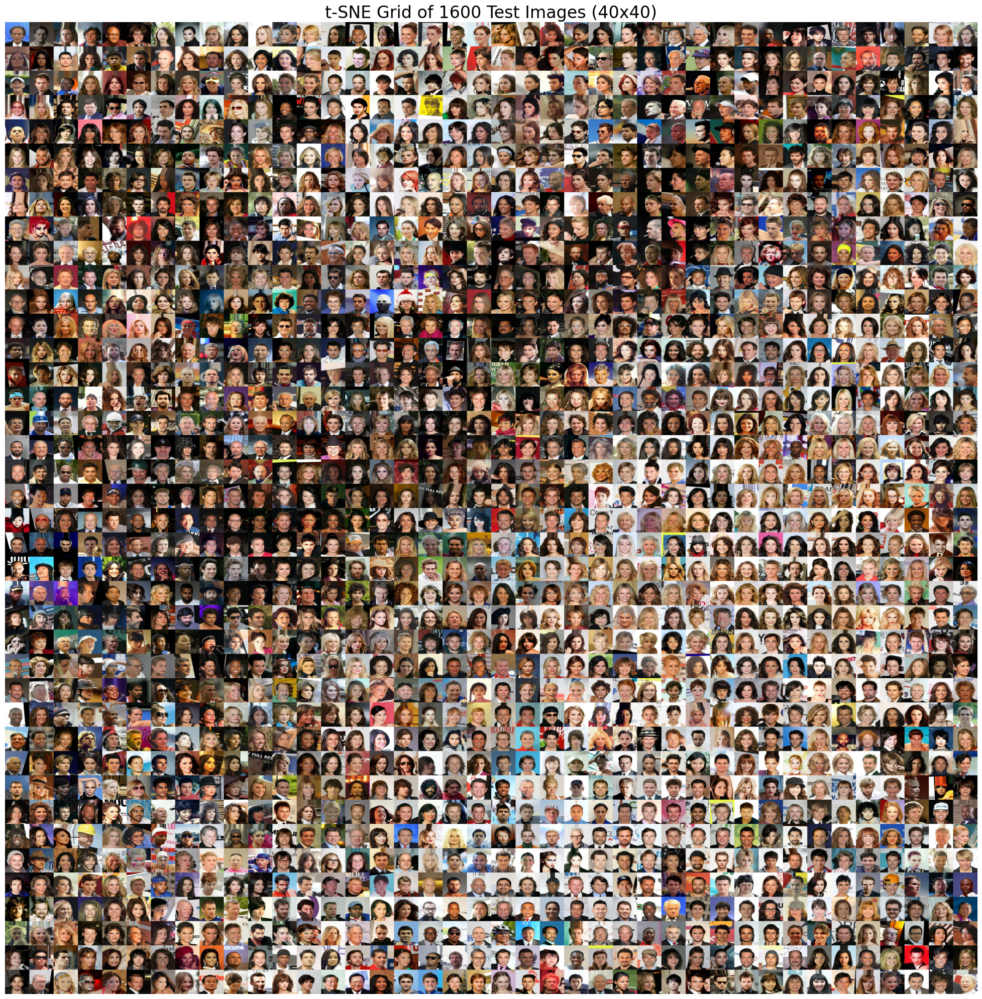

In [10]:
# t-SNE image grid: Place 40x40 sampled test images in a grid based on t-SNE of their latents

import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from tqdm import tqdm

# 1. Sample 1600 (40x40) random test images and store them
sampled_images = []
for img in test_data.shuffle(10000, seed=42).take(1600):
    sampled_images.append(img.numpy())
sampled_images = np.stack(sampled_images, axis=0)  # shape: (1600, 128, 128, 3)

# 2. Encode images to latent space
z_mean, z_log_var, z = encoder(sampled_images)
latents = z.numpy()  # shape: (1600, latent_dim)

# 3. Dimensionality reduction (PCA then t-SNE)
pca = PCA(n_components=50, random_state=42)
latents_pca = pca.fit_transform(latents)
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
latents_2d = tsne.fit_transform(latents_pca)  # shape: (1600, 2)

# 4. Normalize t-SNE coordinates to [0, 1]
tsne_min = latents_2d.min(axis=0)
tsne_max = latents_2d.max(axis=0)
latents_2d_norm = (latents_2d - tsne_min) / (tsne_max - tsne_min)

# 5. Assign each image to a grid cell (40x40)
grid_size = 40
grid = np.zeros((grid_size, grid_size, 128, 128, 3), dtype=np.float32)
used = np.zeros((grid_size, grid_size), dtype=bool)
indices = []

for idx, (x, y) in enumerate(latents_2d_norm):
    gx = min(int(x * (grid_size - 1)), grid_size - 1)
    gy = min(int(y * (grid_size - 1)), grid_size - 1)
    # If cell is already filled, find nearest empty cell
    if not used[gy, gx]:
        grid[gy, gx] = sampled_images[idx]
        used[gy, gx] = True
        indices.append((gy, gx, idx))
    else:
        # Find nearest empty cell (spiral search)
        found = False
        for radius in range(1, grid_size):
            for dx in range(-radius, radius+1):
                for dy in range(-radius, radius+1):
                    ny, nx = gy + dy, gx + dx
                    if 0 <= ny < grid_size and 0 <= nx < grid_size and not used[ny, nx]:
                        grid[ny, nx] = sampled_images[idx]
                        used[ny, nx] = True
                        indices.append((ny, nx, idx))
                        found = True
                        break
                if found:
                    break
            if found:
                break

# 6. Create the big image grid
canvas = np.ones((grid_size * 128, grid_size * 128, 3), dtype=np.float32)
for y in range(grid_size):
    for x in range(grid_size):
        img = grid[y, x]
        canvas[y*128:(y+1)*128, x*128:(x+1)*128] = img

plt.figure(figsize=(20, 20))
plt.imshow(canvas)
plt.axis('off')
plt.title('t-SNE Grid of 1600 Test Images (40x40)', fontsize=24)
plt.tight_layout()
plt.savefig('results_encode_decode/20/attribute_analysis/analysis/tsne_image_grid_40x40.png', dpi=300, bbox_inches='tight')
plt.show()